# Variational AutoEncoder

- **Keras doc** : https://keras.io/examples/generative/vae/
- **Paper** : Auto-Encoding Variational Bayes [ [paper](https://arxiv.org/pdf/1312.6114.pdf) ]
- **Author** : Jaehyuk Heo

In [370]:
import os
import numpy as np
import gdown 
from zipfile import ZipFile

from glob import glob
from PIL import Image
import torch
import torch.nn as nn
from torch.optim import Adam, SGD
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader

import matplotlib.pyplot as plt
from torchinfo import summary

# Config

In [2]:
class Config:
    datadir = '/datasets/celeba_gan'
    img_size = 128
    batch_size = 64
    epochs = 2
    lr = 0.0001
    nb_channel = 3
    
config = Config()
device = 'cuda:1' if torch.cuda.is_available() else 'cpu'

# Load Data

- MNIST

In [3]:
os.makedirs(config.datadir, exist_ok=True)

In [4]:
# url = "https://drive.google.com/uc?id=1O7m1010EJjLE5QxLZiM9Fpjs7Oj6e684"
# output = os.path.join(config.datadir, "data.zip")
# gdown.download(url, output, quiet=False)

# config.datadir = os.path.join(config.datadir,'data')
# with ZipFile(output, "r") as zipobj:
#     zipobj.extractall(config.datadir)

In [5]:
transform = transforms.Compose(
    [transforms.ToTensor(),
     transforms.Resize((config.img_size, config.img_size)),
     ])

dataset = ImageFolder(root=config.datadir, transform=transform)

dataloader = DataLoader(dataset=dataset, batch_size=config.batch_size, shuffle=True, num_workers=4)

In [6]:
img_samples = []
for i in range(10):
    img = Image.open(dataloader.dataset.imgs[i][0])
    img_samples.append(np.array(img))
    
img_samples = np.hstack(img_samples)

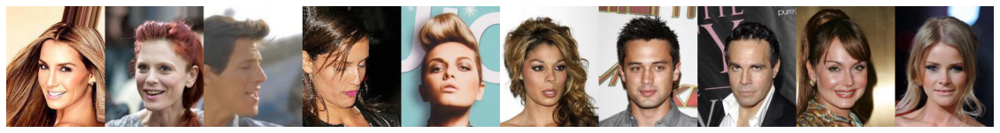

In [7]:
plt.figure(figsize=(20,10))
plt.imshow(img_samples)
plt.axis('off')
plt.show()

# Define VAE

**Reparameterization Trick**

$z = \mu + \sigma \epsilon$, where $\epsilon$ is an auxilary noise variable $\epsilon$ ~ $N(0, 1)$

In [8]:
class VAE(nn.Module):
    def __init__(self, nc, ngf, ndf, latent_variable_size, device):
        super(VAE, self).__init__()

        self.nc = nc
        self.ngf = ngf
        self.ndf = ndf
        self.latent_variable_size = latent_variable_size
        self.device = device

        # encoder
        self.e1 = nn.Conv2d(nc, ndf, 4, 2, 1)
        self.bn1 = nn.BatchNorm2d(ndf)

        self.e2 = nn.Conv2d(ndf, ndf*2, 4, 2, 1)
        self.bn2 = nn.BatchNorm2d(ndf*2)

        self.e3 = nn.Conv2d(ndf*2, ndf*4, 4, 2, 1)
        self.bn3 = nn.BatchNorm2d(ndf*4)

        self.e4 = nn.Conv2d(ndf*4, ndf*8, 4, 2, 1)
        self.bn4 = nn.BatchNorm2d(ndf*8)

        self.e5 = nn.Conv2d(ndf*8, ndf*8, 4, 2, 1)
        self.bn5 = nn.BatchNorm2d(ndf*8)

        self.fc1 = nn.Linear(ndf*8*4*4, latent_variable_size)
        self.fc2 = nn.Linear(ndf*8*4*4, latent_variable_size)

        # decoder
        self.d1 = nn.Linear(latent_variable_size, ngf*8*2*4*4)

        self.up1 = nn.UpsamplingNearest2d(scale_factor=2)
        self.pd1 = nn.ReplicationPad2d(1)
        self.d2 = nn.Conv2d(ngf*8*2, ngf*8, 3, 1)
        self.bn6 = nn.BatchNorm2d(ngf*8, 1.e-3)

        self.up2 = nn.UpsamplingNearest2d(scale_factor=2)
        self.pd2 = nn.ReplicationPad2d(1)
        self.d3 = nn.Conv2d(ngf*8, ngf*4, 3, 1)
        self.bn7 = nn.BatchNorm2d(ngf*4, 1.e-3)

        self.up3 = nn.UpsamplingNearest2d(scale_factor=2)
        self.pd3 = nn.ReplicationPad2d(1)
        self.d4 = nn.Conv2d(ngf*4, ngf*2, 3, 1)
        self.bn8 = nn.BatchNorm2d(ngf*2, 1.e-3)

        self.up4 = nn.UpsamplingNearest2d(scale_factor=2)
        self.pd4 = nn.ReplicationPad2d(1)
        self.d5 = nn.Conv2d(ngf*2, ngf, 3, 1)
        self.bn9 = nn.BatchNorm2d(ngf, 1.e-3)

        self.up5 = nn.UpsamplingNearest2d(scale_factor=2)
        self.pd5 = nn.ReplicationPad2d(1)
        self.d6 = nn.Conv2d(ngf, nc, 3, 1)

        self.leakyrelu = nn.LeakyReLU(0.2)
        self.relu = nn.ReLU()
        self.sigmoid = nn.Sigmoid()

    def encode(self, x):
        h1 = self.leakyrelu(self.bn1(self.e1(x)))
        h2 = self.leakyrelu(self.bn2(self.e2(h1)))
        h3 = self.leakyrelu(self.bn3(self.e3(h2)))
        h4 = self.leakyrelu(self.bn4(self.e4(h3)))
        h5 = self.leakyrelu(self.bn5(self.e5(h4)))
        h5 = h5.view(-1, self.ndf*8*4*4)

        return self.fc1(h5), self.fc2(h5)

    def reparametrize(self, mu, logvar):
        std = logvar.mul(0.5).exp_()
        eps = torch.randn_like(std).to(self.device)

        return eps.mul(std).add_(mu)

    def decode(self, z):
        h1 = self.relu(self.d1(z))
        h1 = h1.view(-1, self.ngf*8*2, 4, 4)
        h2 = self.leakyrelu(self.bn6(self.d2(self.pd1(self.up1(h1)))))
        h3 = self.leakyrelu(self.bn7(self.d3(self.pd2(self.up2(h2)))))
        h4 = self.leakyrelu(self.bn8(self.d4(self.pd3(self.up3(h3)))))
        h5 = self.leakyrelu(self.bn9(self.d5(self.pd4(self.up4(h4)))))

        return self.sigmoid(self.d6(self.pd5(self.up5(h5))))

    def get_latent_var(self, x):
        mu, logvar = self.encode(x.view(-1, self.nc, self.ndf, self.ngf))
        z = self.reparametrize(mu, logvar)
        return z

    def forward(self, x):
        mu, logvar = self.encode(x.view(-1, self.nc, self.ndf, self.ngf))
        z = self.reparametrize(mu, logvar)
        res = self.decode(z)
        return res, mu, logvar


model = VAE(nc=3, ngf=128, ndf=128, latent_variable_size=500, device=device).to(device)

# Train the VAE

![image](https://user-images.githubusercontent.com/37654013/131252912-2ba92e12-1c2e-441f-87a1-f6593f7ec40c.png)

In [9]:
def loss_function(x, x_hat, mean, log_var):
    reproduction_loss = nn.functional.binary_cross_entropy(x_hat, x, reduction='sum')
    kl_loss = - 0.5 * torch.sum(1+ log_var - mean.pow(2) - log_var.exp())
    
    return reproduction_loss + kl_loss


optimizer = Adam(model.parameters(), lr=config.lr)

In [10]:
def train(model, dataloader, criterion, optimizer, device):
    model.train()
    total_loss = 0
    for idx, (inputs, _) in enumerate(dataloader):
        b = inputs.size()[0]
        inputs = inputs.to(device)

        optimizer.zero_grad()

        outputs, z_mean, z_log_var = model(inputs)
        loss = criterion(inputs, outputs, z_mean, z_log_var)

        loss.backward()
        optimizer.step()

        total_loss += loss.item()

        if idx == (len(dataloader)-1):
            print('[%d/%d]: Loss: %.3f' % 
                  (idx+1, len(dataloader), total_loss/((idx+1)*config.batch_size)),end='\n')
        else:
            print('[%d/%d]: Loss: %.3f' % 
                      (idx+1, len(dataloader), total_loss/((idx+1)*config.batch_size)),end='\r')


In [11]:
for epoch in range(config.epochs):
    print(f'Epoch: {epoch+1}/{config.epochs}')
    train(model, dataloader, loss_function, optimizer, device=device)

Epoch: 1/2
[3166/3166]: Loss: 25155.146
Epoch: 2/2
[3166/3166]: Loss: 24606.517


# Visualization with latent dims

In [306]:
from itertools import combinations 

In [362]:
def latent_transition(img1, img2, numsample):
    input1 = transform(img1)
    input2 = transform(img2)
    
    inputs = torch.cat([input1.unsqueeze(0), input2.unsqueeze(0)], dim=0)
    
    z = model.get_latent_var(inputs.to(device))

    it = iter(z.split(1))
    z = zip(it, it)
    zs = []
    
    for i, j in z:
        for factor in np.linspace(0,1,numsample):
            zs.append(i+(j-i)*factor)
    z = torch.cat(zs, 0)

    recon = model.decode(z)
    recon = (recon.permute(0,2,3,1).detach().cpu().numpy()*255).astype(np.uint8)
    return np.hstack(
        np.concatenate([np.expand_dims(img1, axis=0), 
                        recon,
                        np.expand_dims(img2, axis=0)])
    )

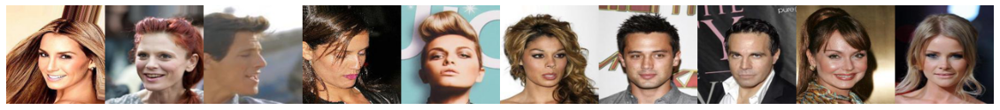

In [363]:
img_samples = []
for i in range(10):
    img = Image.open(dataloader.dataset.imgs[i][0]).resize((config.img_size, config.img_size))
    img_samples.append(np.array(img))


plt.figure(figsize=(20,10))
plt.imshow(np.hstack(img_samples))
plt.axis('off')
plt.show()

In [364]:
img_comb = list(combinations(img_samples, 2))

In [365]:
transition_list = []
for img1, img2 in img_comb:
    transition_imgs = latent_transition(img1, img2, numsample=11)
    transition_list.append(transition_imgs)

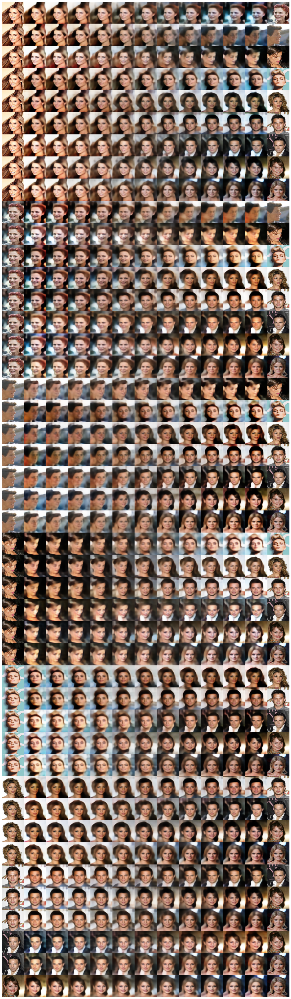

In [366]:
plt.figure(figsize=(30,70))
plt.imshow(np.vstack(transition_list))
plt.axis('off')
plt.show()

# DSBA

In [372]:
dsba = glob('./dsba/*.jpeg')

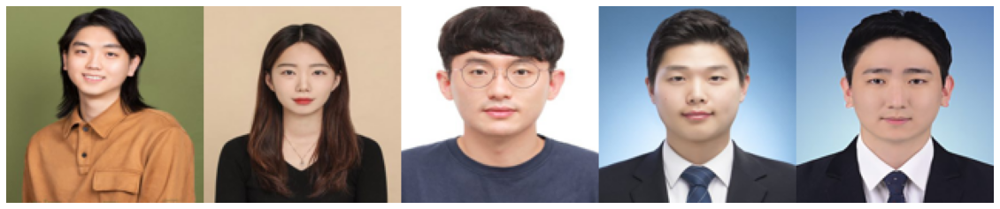

In [382]:
dsba_samples = []
for i in range(len(dsba)):
    img = Image.open(dsba[i]).resize((config.img_size, config.img_size))
    dsba_samples.append(np.array(img))
    
plt.figure(figsize=(20,10))
plt.imshow(np.hstack(dsba_samples))
plt.axis('off')
plt.show()

In [383]:
img_comb = list(combinations(dsba_samples, 2))

In [386]:
transition_list = []
for img1, img2 in img_comb:
    transition_imgs = latent_transition(img1, img2, numsample=6)
    transition_list.append(transition_imgs)

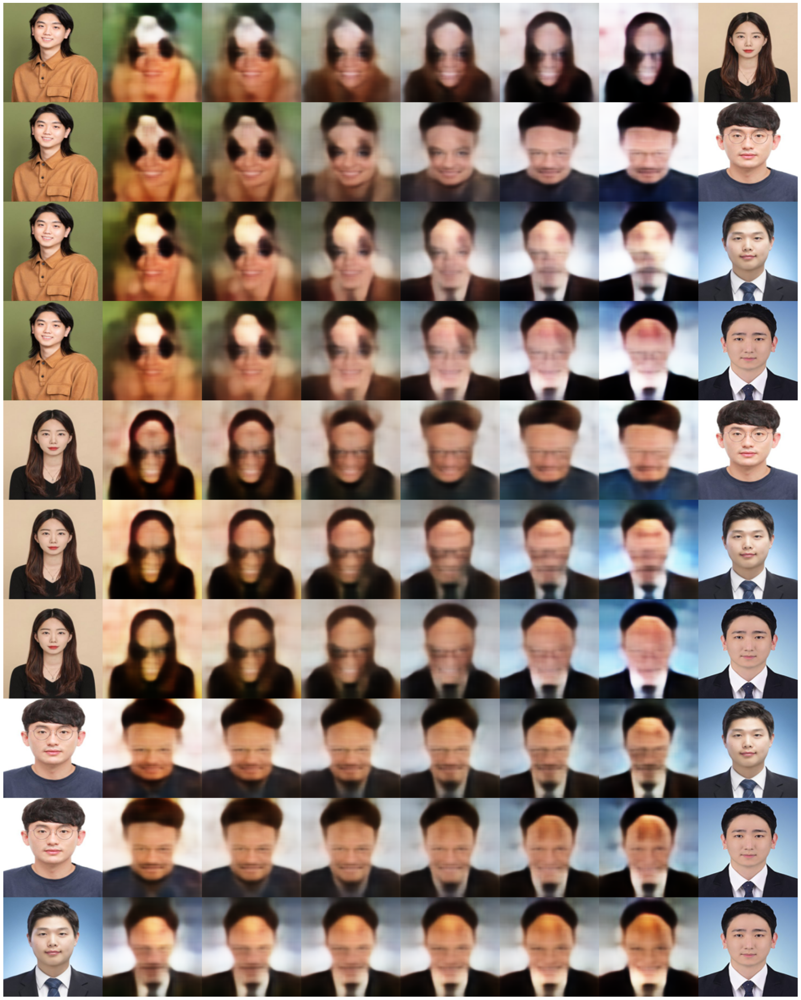

In [387]:
plt.figure(figsize=(30,70))
plt.imshow(np.vstack(transition_list))
plt.axis('off')
plt.show()